In [1]:
import cv2
import glob
import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf
import os

from keras.preprocessing import image
from keras.applications.vgg16 import preprocess_input

In [2]:
import keras
keras.__version__

'2.4.3'

In [3]:
def load_data(data_path,img_shape):
    data_dir_list = os.listdir(data_path)
    img_rows=img_shape[0]
    img_cols=img_shape[1]
    num_channel=img_shape[2]

    labels=[]
    data=[]
    len_list_img=0
    num_class=0
    for dataset in data_dir_list:
        img_list=os.listdir(data_path+'/'+ dataset)    
        for img in img_list:
            input_img = image.load_img(data_path + '/'+ dataset + '/'+ img, target_size=(img_shape[0], img_shape[1]))
            input_img = image.img_to_array(input_img)
            input_img_vgg = preprocess_input(input_img)
            data.append(input_img_vgg)
            labels.append(num_class)
            
        num_class+=1

    data = np.array(data)
    data = data.astype('float32')
    data /= 255
    labels=np.array(labels)

    return data, labels

In [4]:
from keras.utils import np_utils
from keras import backend as K
from sklearn.neighbors import KNeighborsRegressor
from sklearn.neighbors import KNeighborsClassifier
from keras.optimizers import SGD
from keras.applications import VGG16


def KNN_testing(dataset_name="legumes", num_classes=10):
    img_shape = [224, 224, 3]
    train_data_path = 'Datasets/' + dataset_name + 'A'
    X_train, y_train = load_data(train_data_path, img_shape)
    test_data_path = 'Datasets/' + dataset_name + 'B'
    X_test, y_test = load_data(test_data_path, img_shape)
    print("")

    y_train = np_utils.to_categorical(y_train, num_classes)
    y_test = np_utils.to_categorical(y_test, num_classes)

    conv_base = VGG16(weights='imagenet',
                  include_top=True,
                  input_shape=(224, 224, 3))

    conv_base.trainable = False
    model = conv_base

    sgd = SGD(lr=1e-5, decay=1e-6, momentum=0.9, nesterov=True)
    model.compile(loss='categorical_crossentropy', optimizer=sgd,metrics=["accuracy"])

    get_output = K.function([model.layers[0].input], 
                        [model.layers[-2].output])
    last_layer_outputs_train = get_output([X_train])
    last_layer_outputs_test = get_output([X_test])

    # KNN regressor predictions
    KNN_classifier = KNeighborsRegressor(weights='distance', n_neighbors=3)

    KNN_classifier.fit(last_layer_outputs_train[0], y_train)

    predictions = KNN_classifier.predict(last_layer_outputs_test[0])

    preds = []

    for probabilities in predictions:
        average = 0
        for index, probability in enumerate(probabilities):
            average += index * probability
        preds.append(round(average))

    real_target = np.argmax(y_test, axis=1)

    accuracy1 = np.sum(preds == real_target)/y_test.shape[0]
    total_distance_1 = np.sum(abs(preds - real_target))

    print("KNNRegressor results")
    print("Accuracy:", accuracy1)
    print("Total distance:", total_distance_1)
    print("Valeurs cibles:", real_target)
    print("Prédictions: ", preds)
    print("")

    for i in range(len(preds)):
        img1 = cv2.imread(glob.glob(train_data_path + "/" + str(real_target[i]).zfill(2) + "/*")[-1])
        img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)

        img2 = cv2.imread(glob.glob(test_data_path + "/" + str(real_target[i]).zfill(2) + "/*")[-1])
        img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)

        img3 = cv2.imread(glob.glob(train_data_path + "/" + str(preds[i]).zfill(2) + "/*")[-1])
        img3 = cv2.cvtColor(img3, cv2.COLOR_BGR2RGB)
        
        print("Vraie valeur: ", real_target[i])
        print("Prédictions: ", preds[i])

        if real_target[i] == preds[i]:
            print("Bonne prédiction")
        else:
            print("Mauvaise prédiction")

        ax1 = plt.subplot(1, 3, 2)
        ax1.set_title("Prédiction")
        ax1.axis('off')
        plt.imshow(img3)

        ax2 = plt.subplot(1, 3, 1)
        ax2.set_title("À classifier")
        ax2.axis('off')
        plt.imshow(img2)

        ax3 = plt.subplot(1, 3, 3)
        ax3.set_title("Attendue")
        ax3.axis('off')
        plt.imshow(img1)

        plt.show()
    
    # KNN classifier predictions
    KNN_classifier = KNeighborsClassifier(n_neighbors=1)

    KNN_classifier.fit(last_layer_outputs_train[0], y_train)

    predictions = KNN_classifier.predict(last_layer_outputs_test[0])

    predictions = np.argmax(predictions, axis=1)

    real_target = np.argmax(y_test, axis=1)

    accuracy2 = np.sum(predictions == real_target)/y_test.shape[0]
    total_distance_2 = np.sum(abs(predictions - real_target))

    print("KNN Classifier results")
    print("Accuracy:", accuracy2)
    print("Total distance:", total_distance_2)
    print("Valeurs cibles:", real_target)
    print("Prédictions: ", predictions)

    for i in range(len(predictions)):
        img1 = cv2.imread(glob.glob(train_data_path + "/" + str(real_target[i]).zfill(2) + "/*")[-1])
        img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)

        img2 = cv2.imread(glob.glob(test_data_path + "/" + str(real_target[i]).zfill(2) + "/*")[-1])
        img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)

        img3 = cv2.imread(glob.glob(train_data_path + "/" + str(predictions[i]).zfill(2) + "/*")[-1])
        img3 = cv2.cvtColor(img3, cv2.COLOR_BGR2RGB)
        
        print("Vraie valeur: ", real_target[i])
        print("Prédictions: ", predictions[i])

        if real_target[i] == predictions[i]:
            print("Bonne prédiction")
        else:
            print("Mauvaise prédiction")

        ax1 = plt.subplot(1, 3, 2)
        ax1.set_title("Prédiction")
        ax1.axis('off')
        plt.imshow(img3)

        ax2 = plt.subplot(1, 3, 1)
        ax2.set_title("À classifier")
        ax2.axis('off')
        plt.imshow(img2)

        ax3 = plt.subplot(1, 3, 3)
        ax3.set_title("Attendue")
        ax3.axis('off')
        plt.imshow(img1)

        plt.show()

    #return max(accuracy1, accuracy2)


KNNRegressor results
Accuracy: 0.6
Total distance: 5
Valeurs cibles: [0 1 2 3 4 5 6 7 8 9]
Prédictions:  [2, 1, 3, 3, 4, 5, 5, 7, 8, 8]

Vraie valeur:  0
Prédictions:  2
Mauvaise prédiction


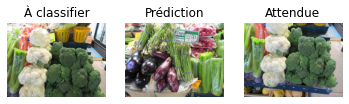

Vraie valeur:  1
Prédictions:  1
Bonne prédiction


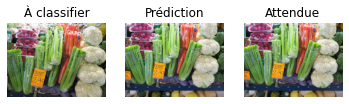

Vraie valeur:  2
Prédictions:  3
Mauvaise prédiction


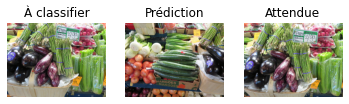

Vraie valeur:  3
Prédictions:  3
Bonne prédiction


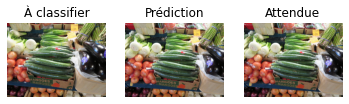

Vraie valeur:  4
Prédictions:  4
Bonne prédiction


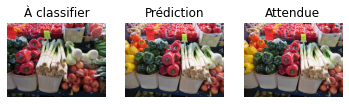

Vraie valeur:  5
Prédictions:  5
Bonne prédiction


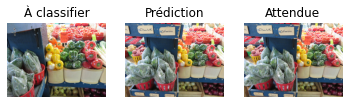

Vraie valeur:  6
Prédictions:  5
Mauvaise prédiction


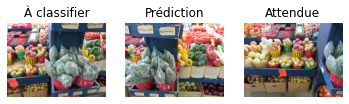

Vraie valeur:  7
Prédictions:  7
Bonne prédiction


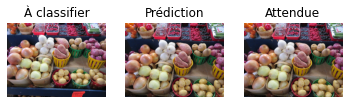

Vraie valeur:  8
Prédictions:  8
Bonne prédiction


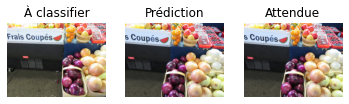

Vraie valeur:  9
Prédictions:  8
Mauvaise prédiction


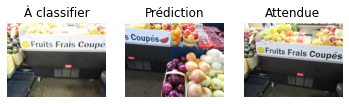

KNN Classifier results
Accuracy: 0.1
Total distance: 45
Valeurs cibles: [0 1 2 3 4 5 6 7 8 9]
Prédictions:  [0 0 0 0 0 0 0 0 0 0]
Vraie valeur:  0
Prédictions:  0
Bonne prédiction


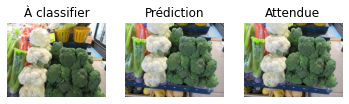

Vraie valeur:  1
Prédictions:  0
Mauvaise prédiction


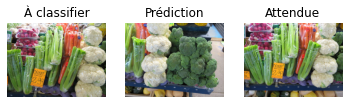

Vraie valeur:  2
Prédictions:  0
Mauvaise prédiction


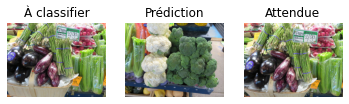

Vraie valeur:  3
Prédictions:  0
Mauvaise prédiction


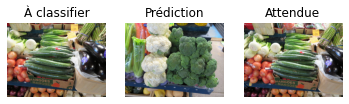

Vraie valeur:  4
Prédictions:  0
Mauvaise prédiction


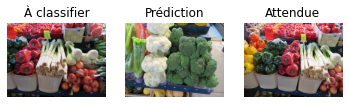

Vraie valeur:  5
Prédictions:  0
Mauvaise prédiction


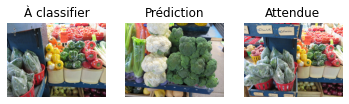

Vraie valeur:  6
Prédictions:  0
Mauvaise prédiction


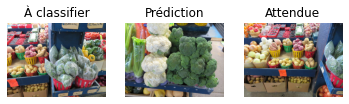

Vraie valeur:  7
Prédictions:  0
Mauvaise prédiction


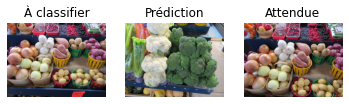

Vraie valeur:  8
Prédictions:  0
Mauvaise prédiction


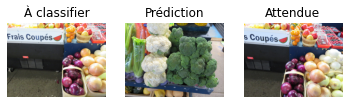

Vraie valeur:  9
Prédictions:  0
Mauvaise prédiction


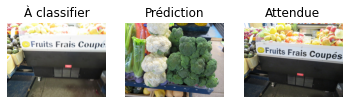

In [5]:
accuracy_legumes = KNN_testing("legumes", 10)


KNNRegressor results
Accuracy: 0.5
Total distance: 6
Valeurs cibles: [0 1 2 3 4 5 6 7 8 9]
Prédictions:  [1, 1, 1, 3, 4, 4, 4, 7, 8, 8]

Vraie valeur:  0
Prédictions:  1
Mauvaise prédiction


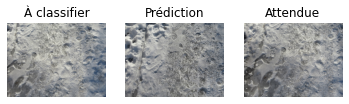

Vraie valeur:  1
Prédictions:  1
Bonne prédiction


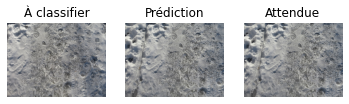

Vraie valeur:  2
Prédictions:  1
Mauvaise prédiction


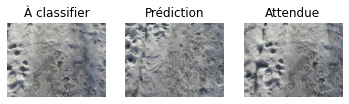

Vraie valeur:  3
Prédictions:  3
Bonne prédiction


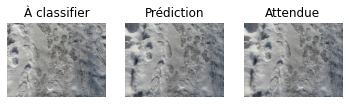

Vraie valeur:  4
Prédictions:  4
Bonne prédiction


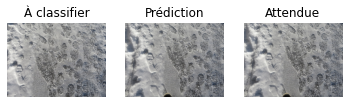

Vraie valeur:  5
Prédictions:  4
Mauvaise prédiction


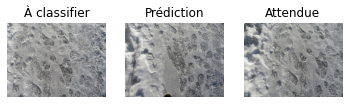

Vraie valeur:  6
Prédictions:  4
Mauvaise prédiction


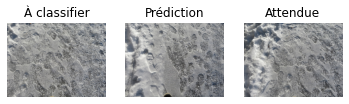

Vraie valeur:  7
Prédictions:  7
Bonne prédiction


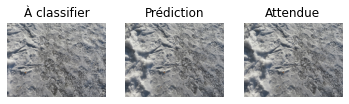

Vraie valeur:  8
Prédictions:  8
Bonne prédiction


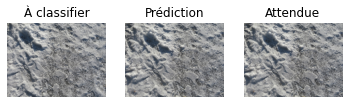

Vraie valeur:  9
Prédictions:  8
Mauvaise prédiction


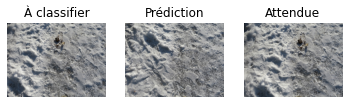

KNN Classifier results
Accuracy: 0.1
Total distance: 45
Valeurs cibles: [0 1 2 3 4 5 6 7 8 9]
Prédictions:  [0 0 0 0 0 0 0 0 0 0]
Vraie valeur:  0
Prédictions:  0
Bonne prédiction


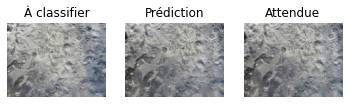

Vraie valeur:  1
Prédictions:  0
Mauvaise prédiction


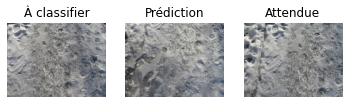

Vraie valeur:  2
Prédictions:  0
Mauvaise prédiction


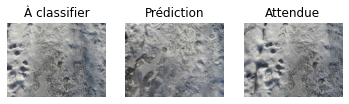

Vraie valeur:  3
Prédictions:  0
Mauvaise prédiction


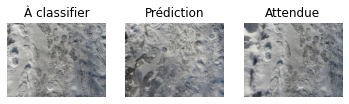

Vraie valeur:  4
Prédictions:  0
Mauvaise prédiction


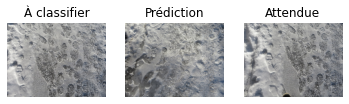

Vraie valeur:  5
Prédictions:  0
Mauvaise prédiction


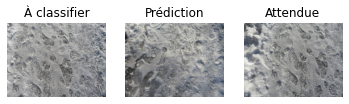

Vraie valeur:  6
Prédictions:  0
Mauvaise prédiction


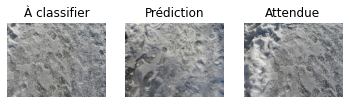

Vraie valeur:  7
Prédictions:  0
Mauvaise prédiction


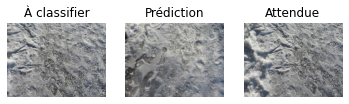

Vraie valeur:  8
Prédictions:  0
Mauvaise prédiction


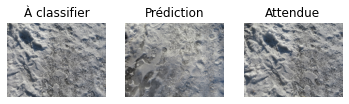

Vraie valeur:  9
Prédictions:  0
Mauvaise prédiction


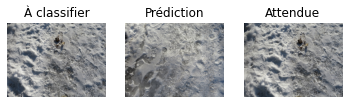

In [6]:
KNN_testing("neige", 10)


KNNRegressor results
Accuracy: 0.18181818181818182
Total distance: 10
Valeurs cibles: [ 0  1  2  3  4  5  6  7  8  9 10]
Prédictions:  [1, 2, 4, 3, 5, 6, 7, 8, 8, 10, 9]

Vraie valeur:  0
Prédictions:  1
Mauvaise prédiction


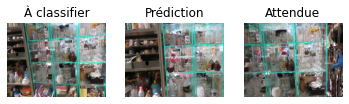

Vraie valeur:  1
Prédictions:  2
Mauvaise prédiction


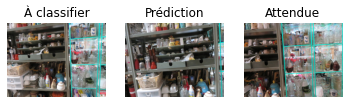

Vraie valeur:  2
Prédictions:  4
Mauvaise prédiction


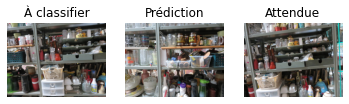

Vraie valeur:  3
Prédictions:  3
Bonne prédiction


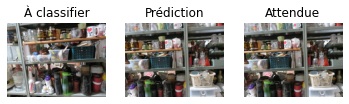

Vraie valeur:  4
Prédictions:  5
Mauvaise prédiction


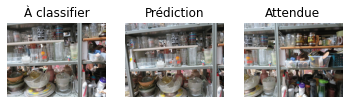

Vraie valeur:  5
Prédictions:  6
Mauvaise prédiction


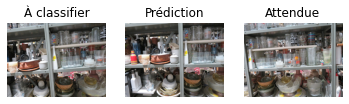

Vraie valeur:  6
Prédictions:  7
Mauvaise prédiction


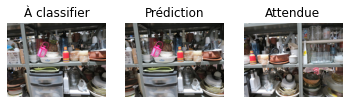

Vraie valeur:  7
Prédictions:  8
Mauvaise prédiction


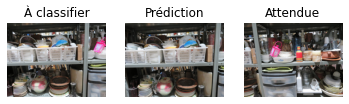

Vraie valeur:  8
Prédictions:  8
Bonne prédiction


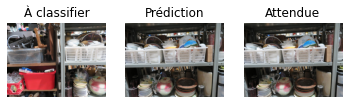

Vraie valeur:  9
Prédictions:  10
Mauvaise prédiction


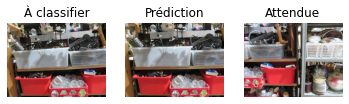

Vraie valeur:  10
Prédictions:  9
Mauvaise prédiction


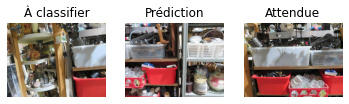

KNN Classifier results
Accuracy: 0.09090909090909091
Total distance: 55
Valeurs cibles: [ 0  1  2  3  4  5  6  7  8  9 10]
Prédictions:  [0 0 0 0 0 0 0 0 0 0 0]
Vraie valeur:  0
Prédictions:  0
Bonne prédiction


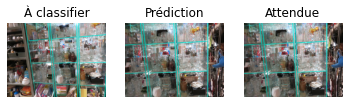

Vraie valeur:  1
Prédictions:  0
Mauvaise prédiction


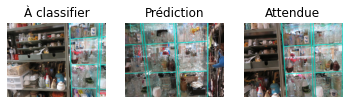

Vraie valeur:  2
Prédictions:  0
Mauvaise prédiction


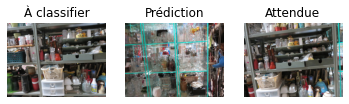

Vraie valeur:  3
Prédictions:  0
Mauvaise prédiction


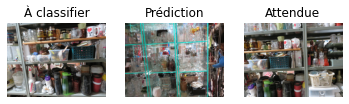

Vraie valeur:  4
Prédictions:  0
Mauvaise prédiction


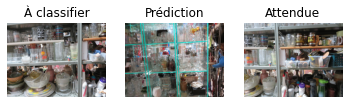

Vraie valeur:  5
Prédictions:  0
Mauvaise prédiction


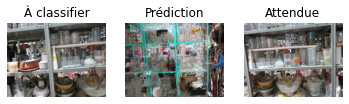

Vraie valeur:  6
Prédictions:  0
Mauvaise prédiction


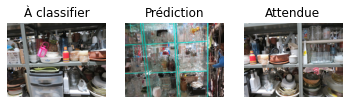

Vraie valeur:  7
Prédictions:  0
Mauvaise prédiction


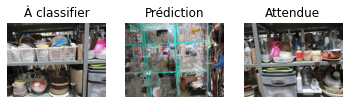

Vraie valeur:  8
Prédictions:  0
Mauvaise prédiction


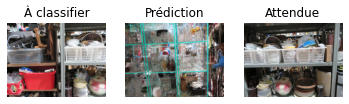

Vraie valeur:  9
Prédictions:  0
Mauvaise prédiction


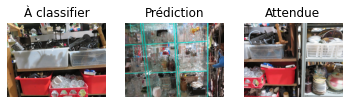

Vraie valeur:  10
Prédictions:  0
Mauvaise prédiction


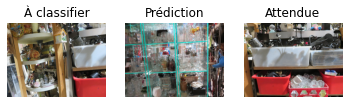

In [7]:
KNN_testing("magasin", 12)


KNN Classifier results
Accuracy: 0.8
Valeurs cibles: [0 1 2 3 4 5 6 7 8 9]
Prédictions:  [1 1 3 3 4 5 6 7 8 9]
Vraie valeur:  0
Prédictions:  1
Mauvaise prédiction


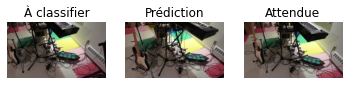

Vraie valeur:  1
Prédictions:  1
Bonne prédiction


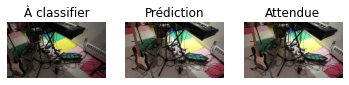

Vraie valeur:  2
Prédictions:  3
Mauvaise prédiction


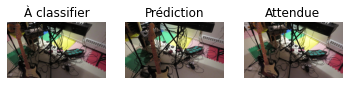

Vraie valeur:  3
Prédictions:  3
Bonne prédiction


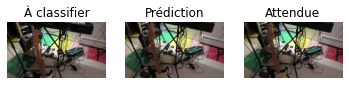

Vraie valeur:  4
Prédictions:  4
Bonne prédiction


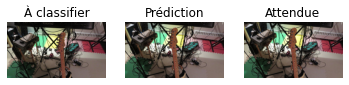

Vraie valeur:  5
Prédictions:  5
Bonne prédiction


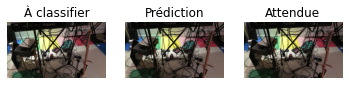

Vraie valeur:  6
Prédictions:  6
Bonne prédiction


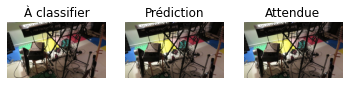

Vraie valeur:  7
Prédictions:  7
Bonne prédiction


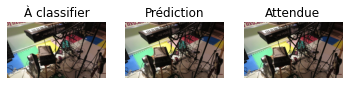

Vraie valeur:  8
Prédictions:  8
Bonne prédiction


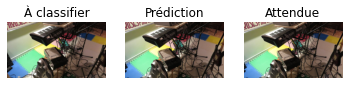

Vraie valeur:  9
Prédictions:  9
Bonne prédiction


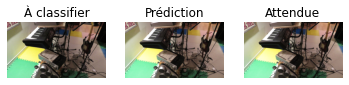

In [22]:
KNN_testing("studio", 10)


KNN Classifier results
Accuracy: 1.0
Valeurs cibles: [0 1 2 3 4 5 6 7 8 9]
Prédictions:  [0 1 2 3 4 5 6 7 8 9]
Vraie valeur:  0
Prédictions:  0
Bonne prédiction


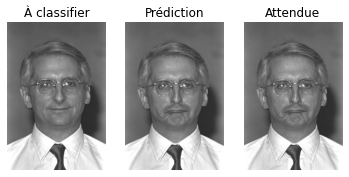

Vraie valeur:  1
Prédictions:  1
Bonne prédiction


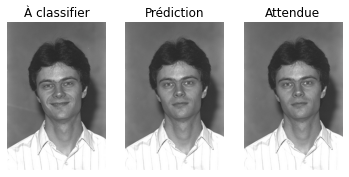

Vraie valeur:  2
Prédictions:  2
Bonne prédiction


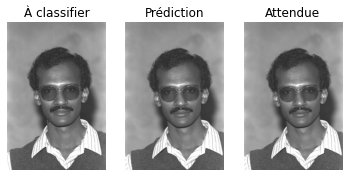

Vraie valeur:  3
Prédictions:  3
Bonne prédiction


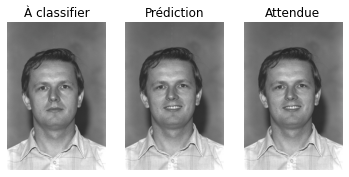

Vraie valeur:  4
Prédictions:  4
Bonne prédiction


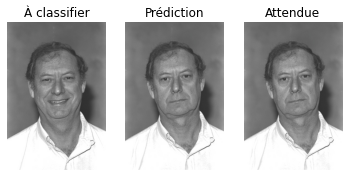

Vraie valeur:  5
Prédictions:  5
Bonne prédiction


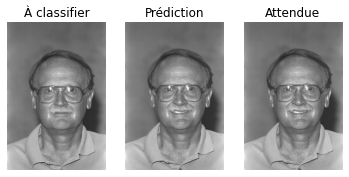

Vraie valeur:  6
Prédictions:  6
Bonne prédiction


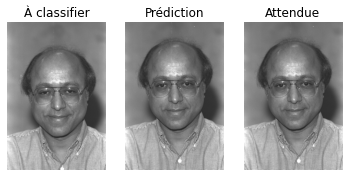

Vraie valeur:  7
Prédictions:  7
Bonne prédiction


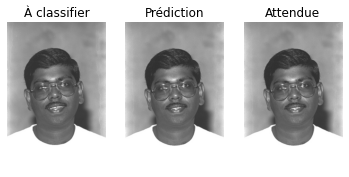

Vraie valeur:  8
Prédictions:  8
Bonne prédiction


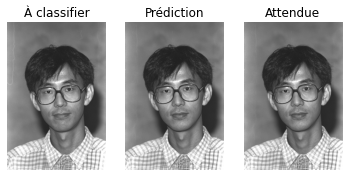

Vraie valeur:  9
Prédictions:  9
Bonne prédiction


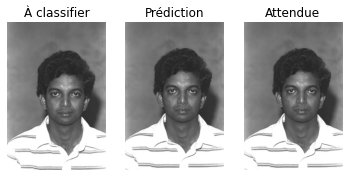

In [23]:
KNN_testing("visages", 10)


KNN Classifier results
Accuracy: 0.6
Valeurs cibles: [0 1 2 3 4 5 6 7 8 9]
Prédictions:  [0 1 2 3 2 5 5 7 2 8]
Vraie valeur:  0
Prédictions:  0
Bonne prédiction


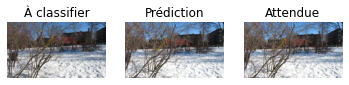

Vraie valeur:  1
Prédictions:  1
Bonne prédiction


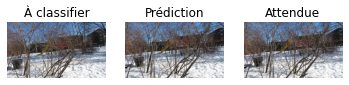

Vraie valeur:  2
Prédictions:  2
Bonne prédiction


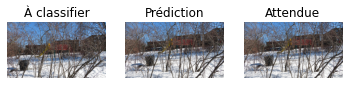

Vraie valeur:  3
Prédictions:  3
Bonne prédiction


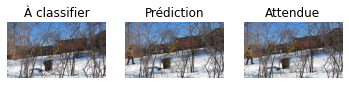

Vraie valeur:  4
Prédictions:  2
Mauvaise prédiction


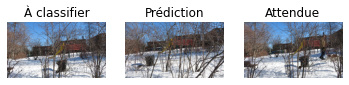

Vraie valeur:  5
Prédictions:  5
Bonne prédiction


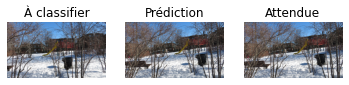

Vraie valeur:  6
Prédictions:  5
Mauvaise prédiction


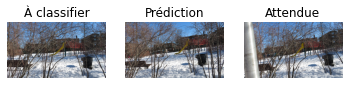

Vraie valeur:  7
Prédictions:  7
Bonne prédiction


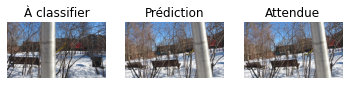

Vraie valeur:  8
Prédictions:  2
Mauvaise prédiction


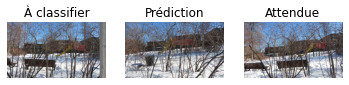

Vraie valeur:  9
Prédictions:  8
Mauvaise prédiction


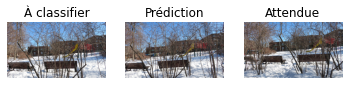

In [24]:
KNN_testing("parc", 10)


KNN Classifier results
Accuracy: 0.6666666666666666
Valeurs cibles: [0 1 2 3 4 5 6 7 8]
Prédictions:  [0 1 2 3 5 5 7 8 8]
Vraie valeur:  0
Prédictions:  0
Bonne prédiction


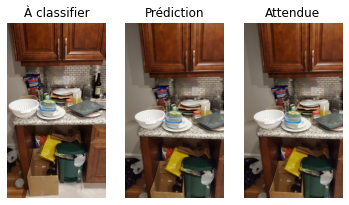

Vraie valeur:  1
Prédictions:  1
Bonne prédiction


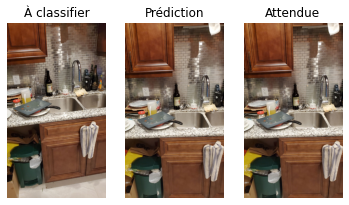

Vraie valeur:  2
Prédictions:  2
Bonne prédiction


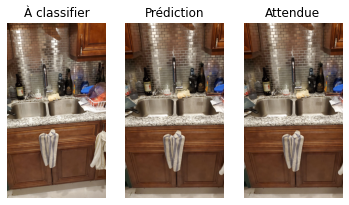

Vraie valeur:  3
Prédictions:  3
Bonne prédiction


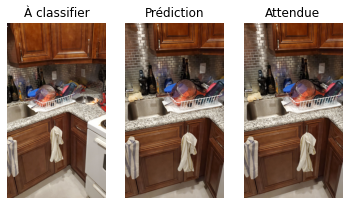

Vraie valeur:  4
Prédictions:  5
Mauvaise prédiction


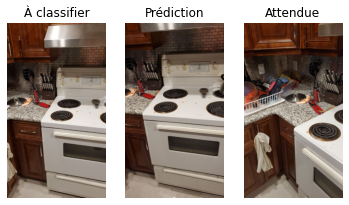

Vraie valeur:  5
Prédictions:  5
Bonne prédiction


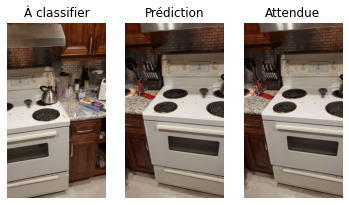

Vraie valeur:  6
Prédictions:  7
Mauvaise prédiction


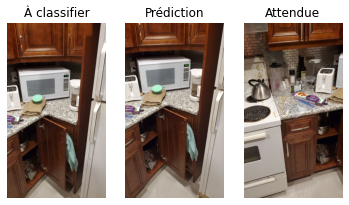

Vraie valeur:  7
Prédictions:  8
Mauvaise prédiction


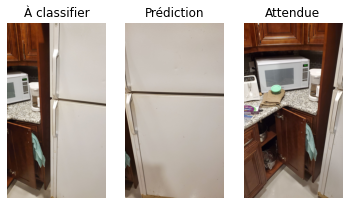

Vraie valeur:  8
Prédictions:  8
Bonne prédiction


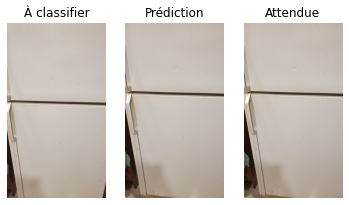

In [25]:
KNN_testing("cuisine", 9)